<a href="https://colab.research.google.com/github/MatheusrCunha/PDS_1/blob/main/Projeto2Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy import signal
from scipy import signal, fftpack

In [ ]:
[fs_audio,audio]=wavfile.read('Motor_interf_150Hz.wav')
audio = audio.astype(np.float64)

In [ ]:
print('A frequência de amostragem é: {}Hz'.format(fs_audio))

A frequência de amostragem é: 44100Hz


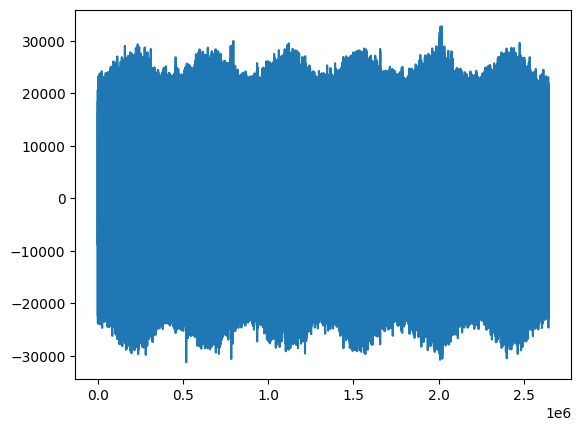

In [ ]:
plt.plot(audio)

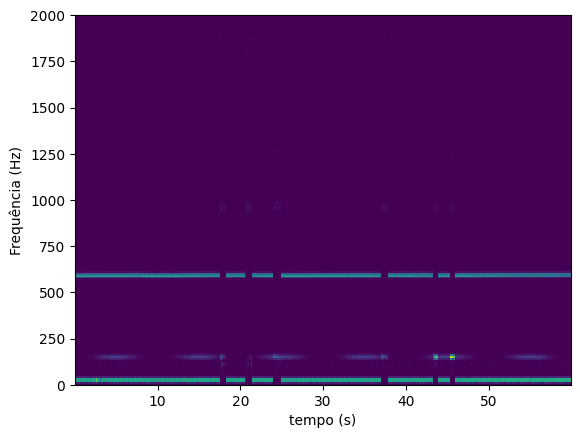

In [ ]:
window = signal.windows.parzen(int(44100/10))
freq,tempo,potencia = signal.spectrogram(audio, fs_audio, window=window)
plt.pcolormesh(tempo,freq,potencia)
plt.xlabel('tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.ylim([0, 2000])
plt.show()

Text(0.5, 1.0, 'Espectro de magnitude em frequência')

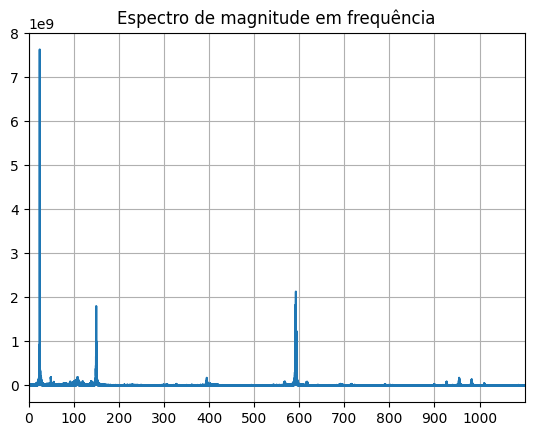

In [ ]:
N = len(audio)
DFT_sine = fftpack.fft(audio,N)
mag_espectro = np.abs(DFT_sine)
f = fftpack.fftfreq(N, 1 / fs_audio)
plt.plot(fftpack.fftshift(f),fftpack.fftshift(mag_espectro))
plt.xlim(0, 1100)
plt.xticks(range(0, 1100, 100))
plt.grid()
plt.title('Espectro de magnitude em frequência')

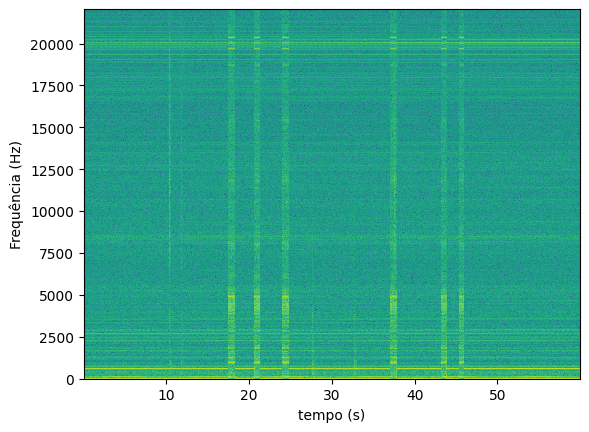

In [ ]:
potencia_dB = 10*np.log10(potencia)
plt.pcolormesh(tempo,freq,potencia_dB)
plt.xlabel('tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.show()

(140.0, 160.0)

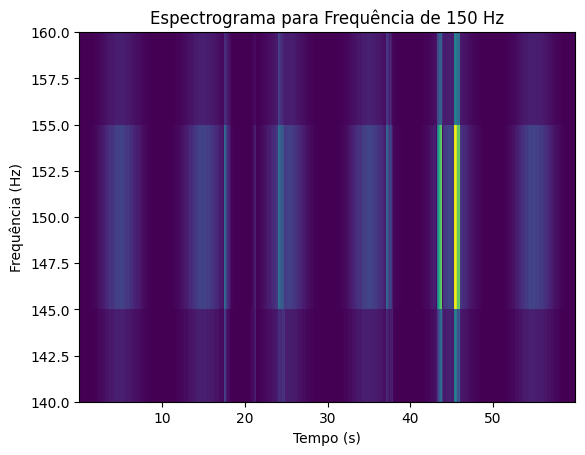

In [ ]:
freq_150hz_index = np.argmin(np.abs(freq - 150))
plt.pcolormesh(tempo, freq[freq_150hz_index-10:freq_150hz_index+10], potencia[freq_150hz_index-10:freq_150hz_index+10, :])
plt.xlabel('Tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.title('Espectrograma para Frequência de 150 Hz')
plt.ylim([140, 160])

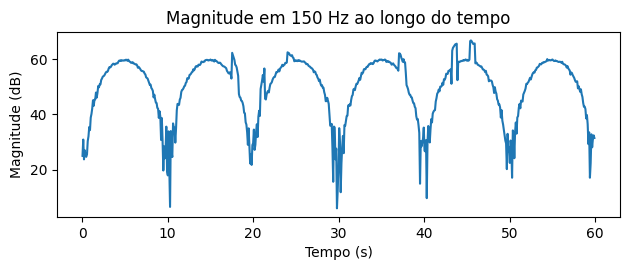

In [ ]:
plt.subplot(2, 1, 2)
plt.plot(tempo, 10 * np.log10(potencia[freq_150hz_index, :]))
plt.xlabel('Tempo (s)'), plt.ylabel('Magnitude (dB)')
plt.title('Magnitude em 150 Hz ao longo do tempo')

plt.tight_layout()
plt.show()

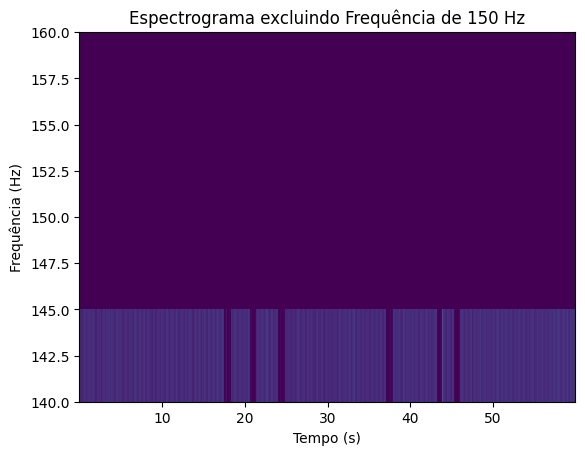

In [ ]:
excluir_inicio = freq_150hz_index - 10
excluir_fim = freq_150hz_index + 10

espectrograma_sem_150hz = np.delete(potencia, range(excluir_inicio, excluir_fim), axis=0)
novas_freq = np.delete(freq, range(excluir_inicio, excluir_fim))

plt.pcolormesh(tempo, novas_freq, espectrograma_sem_150hz, shading='auto')
plt.xlabel('Tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.title('Espectrograma excluindo Frequência de 150 Hz')
plt.ylim([140, 160])
plt.show()

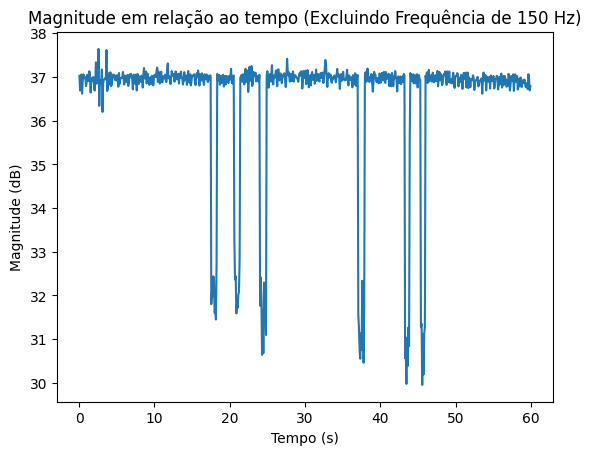

In [ ]:
# Calcular a média da magnitude ao longo da faixa de frequência desejada
magnitude_sem_150hz = np.mean(espectrograma_sem_150hz, axis=0)

# Plotar a magnitude em relação ao tempo
plt.plot(tempo, 10 * np.log10(magnitude_sem_150hz))
plt.xlabel('Tempo (s)'), plt.ylabel('Magnitude (dB)')
plt.title('Magnitude em relação ao tempo (Excluindo Frequência de 150 Hz)')
plt.show()


Início sem magnitude: 17.55s, Fim sem magnitude: 18.25s
Início sem magnitude: 20.61s, Fim sem magnitude: 21.31s
Início sem magnitude: 24.03s, Fim sem magnitude: 24.81s
Início sem magnitude: 37.06s, Fim sem magnitude: 37.85s
Início sem magnitude: 43.28s, Fim sem magnitude: 43.89s
Início sem magnitude: 45.38s, Fim sem magnitude: 45.90s


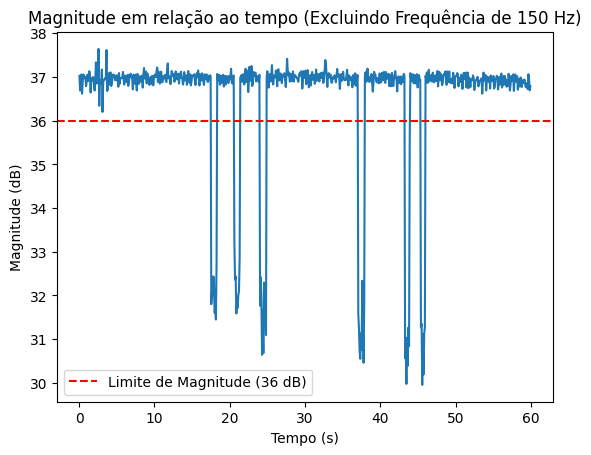

In [ ]:
# Definir um limite de magnitude (em dB) abaixo do qual consideramos que não há sinal
limite_magnitude_dB = 36  # Ajuste conforme necessário

# Encontrar os índices onde a magnitude está abaixo do limite
indices_sem_magnitude = np.where(10 * np.log10(magnitude_sem_150hz) < limite_magnitude_dB)[0]

# Dividir os índices em intervalos
intervalos_sem_magnitude = np.split(indices_sem_magnitude, np.where(np.diff(indices_sem_magnitude) != 1)[0] + 1)

# Imprimir os intervalos
for intervalo in intervalos_sem_magnitude:
    tempo_inicio_sem_magnitude = tempo[intervalo[0]]
    tempo_fim_sem_magnitude = tempo[intervalo[-1]]
    print(f'Início sem magnitude: {tempo_inicio_sem_magnitude:.2f}s, Fim sem magnitude: {tempo_fim_sem_magnitude:.2f}s')

# Plotar a magnitude ao longo do tempo
plt.plot(tempo, 10 * np.log10(magnitude_sem_150hz))
plt.xlabel('Tempo (s)'), plt.ylabel('Magnitude (dB)')
plt.title('Magnitude em relação ao tempo (Excluindo Frequência de 150 Hz)')
plt.axhline(limite_magnitude_dB, color='red', linestyle='--', label=f'Limite de Magnitude ({limite_magnitude_dB} dB)')
plt.legend()
plt.show()


In [ ]:
from IPython.display import Audio
Audio(audio, rate=fs_audio)

In [ ]:
#Segundo sinal - 1KHz
[fs_audio,audio]=wavfile.read('Motor_interf_1kHz.wav')
audio = audio.astype(np.float64)

In [ ]:
print('A frequência de amostragem é: {}Hz'.format(fs_audio))

A frequência de amostragem é: 44100Hz


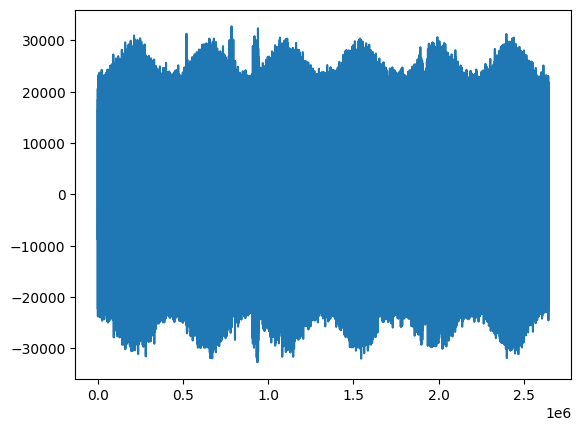

In [ ]:
plt.plot(audio)

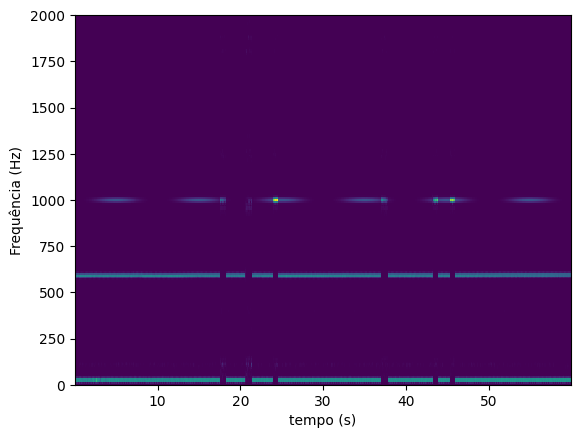

In [ ]:
freq,tempo,potencia = signal.spectrogram(audio, fs_audio, window=window)
plt.pcolormesh(tempo,freq,potencia)
plt.xlabel('tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.ylim([0, 2000])
plt.show()

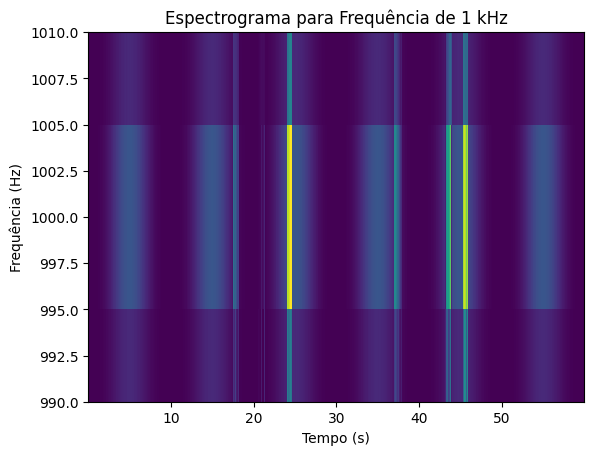

In [ ]:
freq_1khz_index = np.argmin(np.abs(freq - 1000))
plt.pcolormesh(tempo, freq[freq_1khz_index-10:freq_1khz_index+10], potencia[freq_1khz_index-10:freq_1khz_index+10, :])
plt.xlabel('Tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.title('Espectrograma para Frequência de 1 kHz')
plt.ylim([990, 1010])
plt.show()

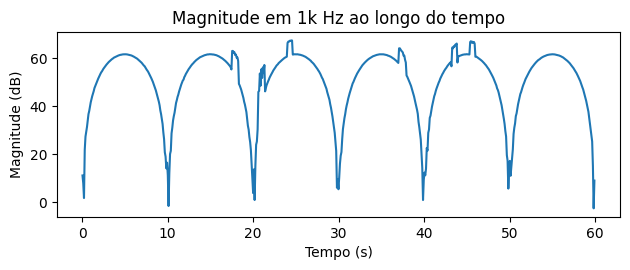

In [ ]:
plt.subplot(2, 1, 2)
plt.plot(tempo, 10 * np.log10(potencia[freq_1khz_index, :]))
plt.xlabel('Tempo (s)'), plt.ylabel('Magnitude (dB)')
plt.title('Magnitude em 1k Hz ao longo do tempo')
plt.tight_layout()
plt.show()

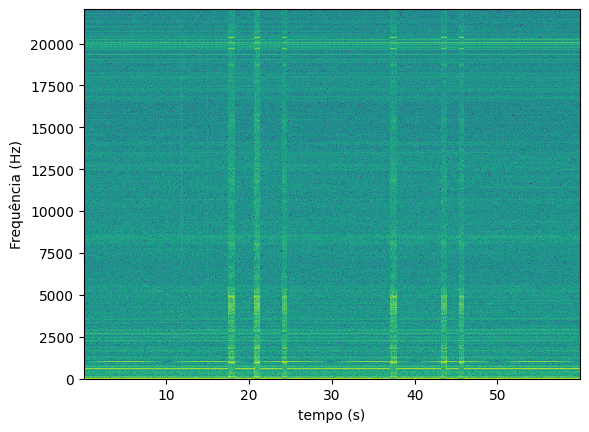

In [ ]:
potencia_dB = 10*np.log10(potencia)
plt.pcolormesh(tempo,freq,potencia_dB)
plt.xlabel('tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.show()

Text(0.5, 1.0, 'Espectro de magnitude em frequência')

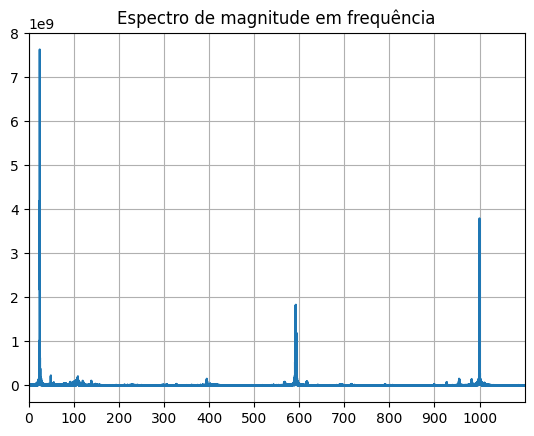

In [ ]:
N = len(audio)
DFT_sine = fftpack.fft(audio,N)
mag_espectro = np.abs(DFT_sine)
f = fftpack.fftfreq(N, 1 / fs_audio)
plt.plot(fftpack.fftshift(f),fftpack.fftshift(mag_espectro))
plt.xlim(0, 1100)
plt.xticks(range(0, 1100, 100))
plt.grid()
plt.title('Espectro de magnitude em frequência')

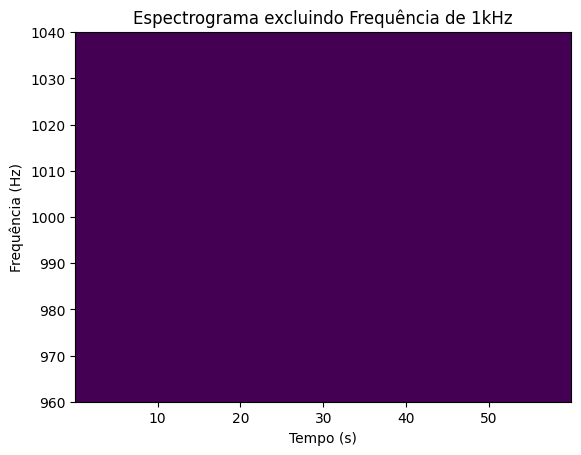

In [ ]:
excluir_inicio = freq_1khz_index - 10
excluir_fim = freq_1khz_index + 10

espectrograma_sem_1khz = np.delete(potencia, range(excluir_inicio, excluir_fim), axis=0)
novas_freq = np.delete(freq, range(excluir_inicio, excluir_fim))

plt.pcolormesh(tempo, novas_freq, espectrograma_sem_150hz, shading='auto')
plt.xlabel('Tempo (s)'), plt.ylabel('Frequência (Hz)')
plt.title('Espectrograma excluindo Frequência de 1kHz')
plt.ylim([960, 1040])
plt.show()


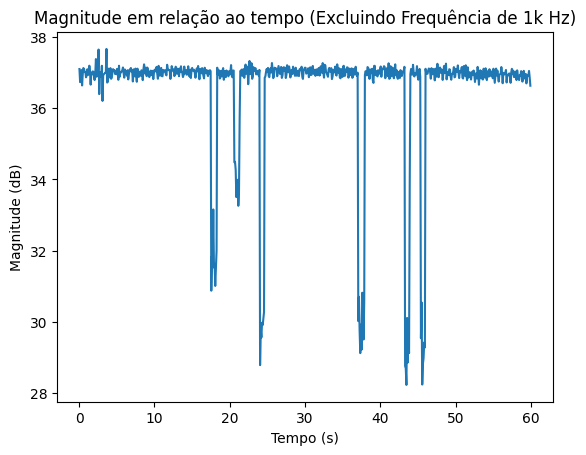

In [ ]:
# Calcular a média da magnitude ao longo da faixa de frequência desejada
magnitude_sem_1khz = np.mean(espectrograma_sem_1khz, axis=0)

# Plotar a magnitude em relação ao tempo
plt.plot(tempo, 10 * np.log10(magnitude_sem_1khz))
plt.xlabel('Tempo (s)'), plt.ylabel('Magnitude (dB)')
plt.title('Magnitude em relação ao tempo (Excluindo Frequência de 1k Hz)')
plt.show()


In [ ]:
from IPython.display import Audio
Audio(audio, rate=fs_audio)